ENVIRONMENT: spatial_ced_1

In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
import scanpy as sc
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
np.random.seed(0)
import geopandas as gpd
from matplotlib.patheffects import withStroke
import os
from datetime import datetime
from scipy.sparse import csc_matrix
from scipy.io import savemat
import dill
import json
import gseapy
import matplotlib as mpl
import math
import scipy
import plotly.express as px
from adjustText import adjust_text
from statsmodels.stats.multitest import multipletests
import session_info2
import tifffile as tiff

from shapely.geometry import LineString
from scipy.stats import zscore
import warnings
warnings.filterwarnings("ignore")

import gseapy as gp
import sys
shedding_paper_utils = "/mnt/x/Common/Lab_Papers/shedding_potential/utils"
sys.path.append(shedding_paper_utils)
import plot_gsea
import importlib

my_path = os.getcwd()

mpl.rcParams['pdf.fonttype'] = 42 # to edit text in Illustrator
mpl.rcParams['ps.fonttype'] = 42
plt.rcParams.update({
    "font.size": 14,    
    "axes.titlesize": 16,    
    "axes.labelsize": 14,  
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,  
    "legend.fontsize": 14
})
LOAD_ARIAL = True
if LOAD_ARIAL:
    # set the default font to Arial
    from matplotlib.font_manager import FontProperties, fontManager
    from matplotlib import rcParams
    # Path to Arial font
    arial_path = '/mnt/x/common/joint_projects/spatial_celiac/utils/Arial.ttf'

    # Define font properties with the specific path
    arial_font = FontProperties(fname=arial_path)
    fontManager.addfont(arial_path)

    # Set the font as the default for all text elements
    rcParams['font.family'] = arial_font.get_family()
    rcParams['font.sans-serif'] = [arial_font.get_name()]

## Load data

In [2]:
TEXT_OUTPUT_MODE = False
fast_load = True
if fast_load:
    fast_load_prefix = "/mnt/d/celiac_files/"
else:   
    fast_load_prefix = ""

In [3]:
joint_ad_path = 'joint_ad.dill'

with open(fast_load_prefix+joint_ad_path, 'rb') as f:
    all_ad = dill.load(f)

all_ad

AnnData object with n_obs × n_vars = 718521 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'cell_x_um', 'cell_y_um', 'geometry', 'sample_name', 'macrozone', 'MM_LP_crypt', 'brunner', 'villus', 'immune', 'lowest_lumen', 'crypt_base', 'pixel_class', 'bc', 'slide', 'sum_of_umis', 'block_id', 'pt', 'age', 'sex', 'group', 'ttg', 'inflammation_bulb', 'inflammation_2nd_part', 'visium_batch', 'dv200', 'uscd', 'block_name', 'notes', 'median_sum_of_umis', 'crypt_villi_part'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'
    layers: 'counts', 'mat_norm', 'log_norm'

In [4]:
all_ad.obs.sample_name.unique()

array(['ST_033', 'ST_038', 'ST_052', 'ST_046', nan, 'ST_073', 'ST_054',
       'ST_004', 'ST_072', 'ST_060', 'ST_076', 'ST_105', 'ST_102',
       'ST_080B1', 'ST_109B1', 'ST_080B2', 'ST_109B2'], dtype=object)

In [5]:
samples_to_drop = ["ST_060","ST_073","ST_080B2","ST_109B2"]
print(all_ad.shape)
all_ad = all_ad[~all_ad.obs.sample_name.isin(samples_to_drop)]
print(all_ad.shape)

(718521, 18085)
(518635, 18085)


In [6]:
# load scalefactors files
ced1_path = "/mnt/x/Common/Joint_projects/spatial_celiac/visiumhd_experiment1/5_outs/CeD/"
ct_path = "/mnt/x/Common/Joint_projects/spatial_celiac/visiumhd_experiment1/5_outs/CT/"

ct_path_08 = ct_path+"/binned_outputs/square_008um/"
scalefactor_path = ct_path_08+"/spatial/scalefactors_json.json"
scalefactors_ct = pd.read_json(scalefactor_path, typ='series')

ced1_path_08 = ced1_path+"/binned_outputs/square_008um/"
scalefactor_path = ced1_path_08+"/spatial/scalefactors_json.json"
scalefactors_ced = pd.read_json(scalefactor_path, typ='series')

In [7]:
# # add crypt_villus class

# # load classification table
# classes_df = pd.read_csv(my_path+"/pseudobulk_data/Classes_by_villus_crypt_epithelium.csv", index_col=0)

# # add disease class to all_ad
# all_ad.obs['villus_crypt_class'] = all_ad.obs['sample_name'].map(classes_df['disease_class'])

# # add string version of class
# na_mask = ~all_ad.obs['villus_crypt_class'].isna()
# all_ad.obs.loc[na_mask, 'villus_crypt_class_name'] = "cv"+all_ad.obs.loc[na_mask, 'villus_crypt_class'].astype(int).astype(str)

### Filter

In [8]:
UMI_THRESH = 100

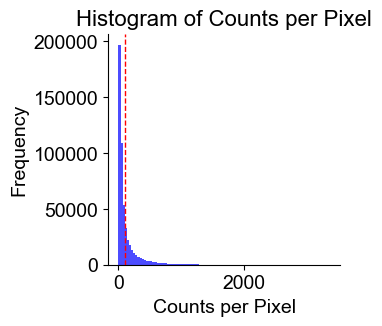

In [9]:
# plot histogram of counts
plt.figure(figsize=(3, 3))
plt.hist(all_ad.layers['counts'].sum(axis=1).A1, bins=100, color='blue', alpha=0.7)
plt.axvline(UMI_THRESH, color='red', linestyle='dashed', linewidth=1)
plt.title('Histogram of Counts per Pixel')
plt.xlabel('Counts per Pixel')
plt.ylabel('Frequency')
sns.despine()

In [10]:
# filter pixels with counts below UMI_THRESH
print(all_ad.shape)
all_ad = all_ad[all_ad.layers['counts'].sum(axis=1).A1 > UMI_THRESH, :]
print(all_ad.shape)

(518635, 18085)
(160443, 18085)


In [11]:
# remove pixel_class == "NA"
all_ad = all_ad[all_ad.obs["pixel_class"].isin(['epithelium','non_epithelium']), :]

# remove pixels that are not in villus or crypt
all_ad = all_ad[all_ad.obs['MM_LP_crypt']+all_ad.obs['villus'],:]

In [12]:
# filter samples with less than 1000 pixels
PIXELS_PER_SAMPLE = 1000
sample_counts = all_ad.obs['sample_name'].value_counts()
samples_to_keep = sample_counts[sample_counts >= PIXELS_PER_SAMPLE].index
print(f"Keeping {len(samples_to_keep)} samples with at least {PIXELS_PER_SAMPLE} pixels")
# print size before and after filtering
print(f"Size before filtering: {all_ad.shape}")
all_ad = all_ad[all_ad.obs['sample_name'].isin(samples_to_keep), :]
print(f"Size after filtering: {all_ad.shape}")

Keeping 8 samples with at least 1000 pixels
Size before filtering: (94821, 18085)
Size after filtering: (93698, 18085)


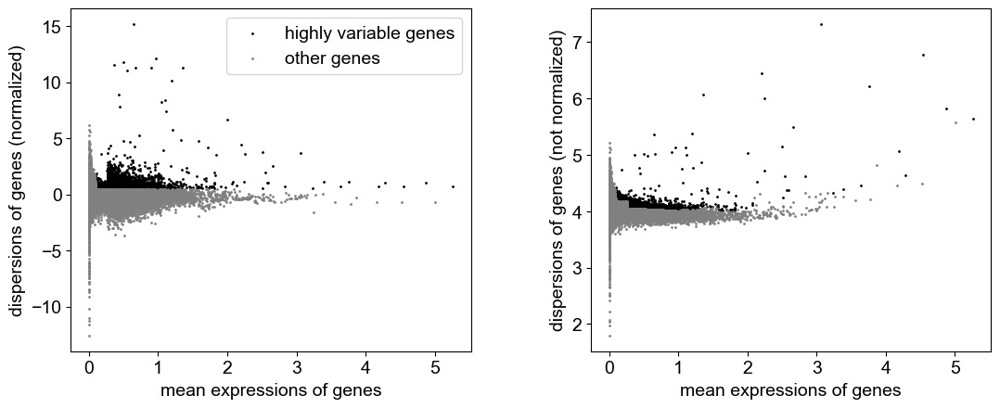

In [13]:
sc.pp.highly_variable_genes(all_ad, layer='log_norm', min_mean=0.095, max_mean=10, min_disp=0.5)
sc.pl.highly_variable_genes(all_ad)

all_ad.layers['log_zscore'] = all_ad.layers['log_norm']
sc.pp.scale(all_ad, layer='log_zscore', max_value=10)

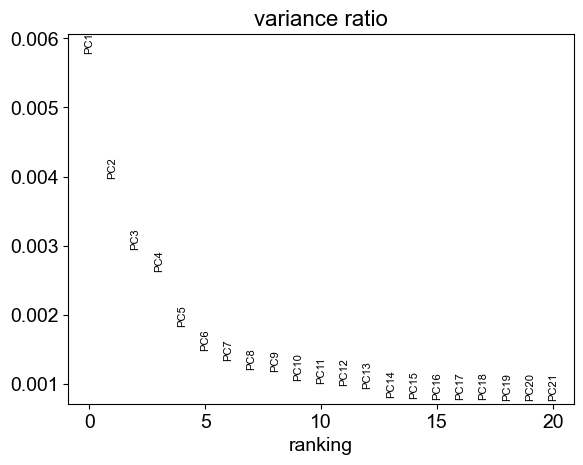

In [14]:
# Compute pca and umap
sc.pp.pca(all_ad, svd_solver='arpack', layer="log_zscore", random_state=1)
sc.pl.pca_variance_ratio(all_ad, n_pcs=20)

In [15]:
sc.pp.neighbors(all_ad, n_neighbors=10, n_pcs=40, random_state=1) # Number of neighbors can have a considerable effect on how the umap looks. Number of PCs - needs to be high enough.
sc.tl.umap(all_ad, random_state=1)

In [16]:
leiden_res = 1.5
sc.tl.leiden(all_ad, resolution=leiden_res, random_state=1)

In [17]:
# add sum of umis per pixel
all_ad.obs['sum_umis'] = all_ad.layers['counts'].sum(axis=1).A1
all_ad.obs['log10_sum_umis'] = np.log10(all_ad.obs['sum_umis'])

### Plot and annotate

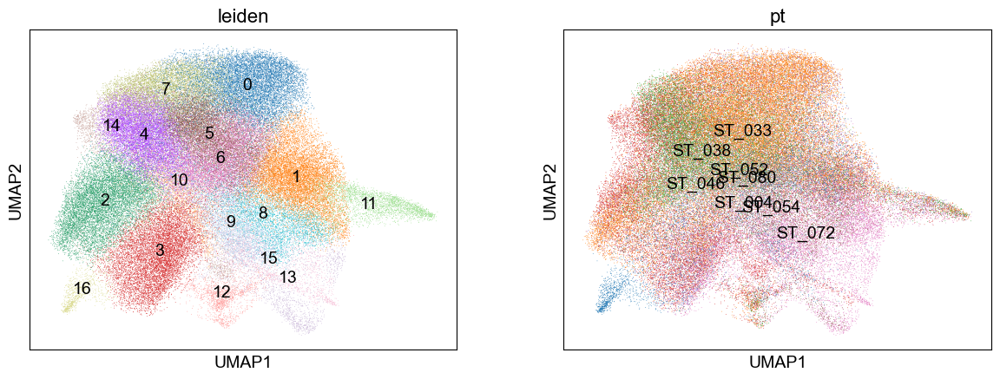

In [18]:
sc.pl.umap(all_ad, color=["leiden",'pt'], legend_loc='on data')

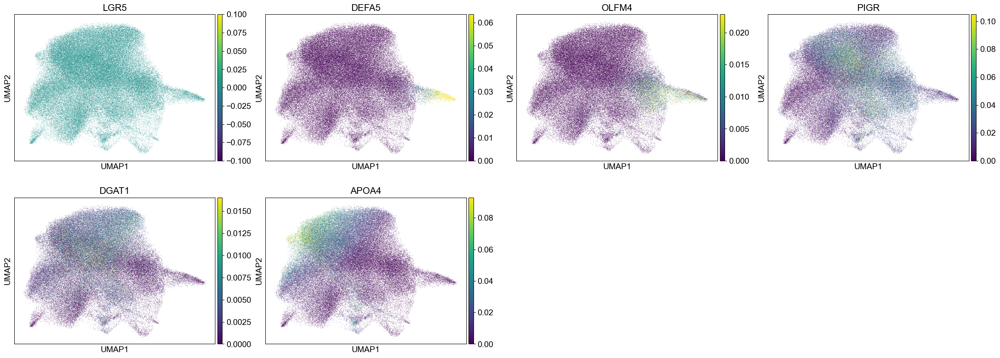

In [19]:
sc.pl.umap(all_ad, color=["LGR5","DEFA5","OLFM4","PIGR","DGAT1","APOA4"], vmax="p99", layer='mat_norm')

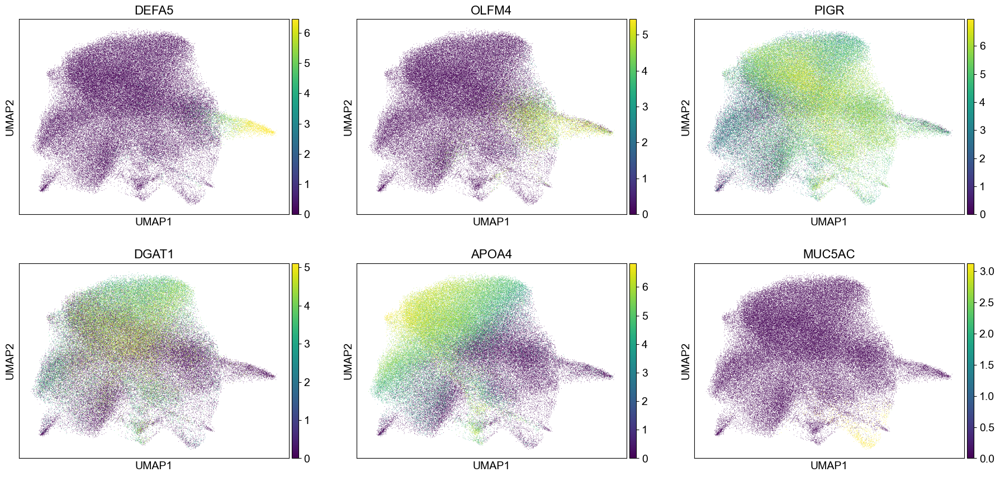

In [20]:
sc.pl.umap(all_ad, color=["DEFA5","OLFM4","PIGR","DGAT1","APOA4","MUC5AC"], ncols=3, vmax="p99", layer='log_norm')

### Fraction of group in clusters

<Figure size 1000x500 with 0 Axes>

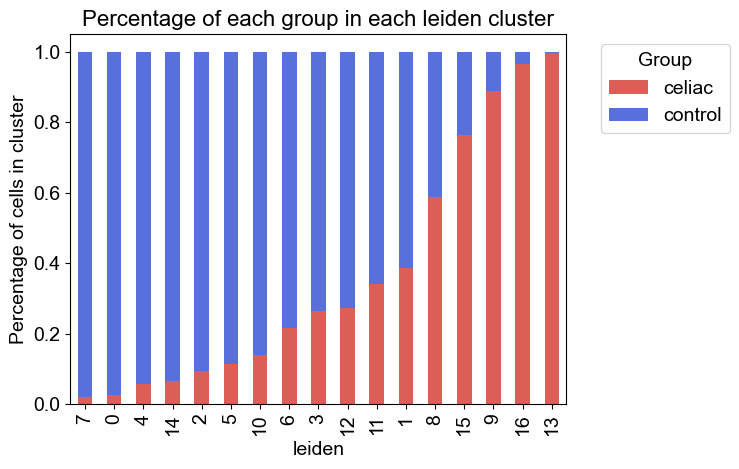

In [21]:
# stacked barplot of each leiden cluster by the percentage of each group
# first calculate the percentage of each group in each leiden cluster
group_percentage_df = pd.DataFrame(columns=['leiden', 'group', 'percentage'])
for leiden in all_ad.obs['leiden'].unique():
    tmp_df = all_ad.obs[all_ad.obs['leiden'] == leiden]
    for group in tmp_df['group'].unique():
        group_percentage = len(tmp_df[tmp_df['group'] == group]) / len(tmp_df)
        group_percentage_df.loc[len(group_percentage_df)] = {'leiden': leiden, 'group': group, 'percentage': group_percentage}

# stacked bar plot of each leiden cluster by the percentage of each group
plt.figure(figsize=(10, 5))
colors = sns.color_palette("hls", 8)
group_percentage_pivot = group_percentage_df.pivot(index='leiden', columns='group', values='percentage').sort_index(key=lambda x: x.astype(int))
# fill NaN values with 0
group_percentage_pivot = group_percentage_pivot.fillna(0)
group_percentage_pivot = group_percentage_pivot.sort_values(by='celiac', key=lambda x: x.astype(float))
group_percentage_pivot.plot(kind='bar', stacked=True, color={'celiac': colors[0], 'control': colors[5]})
plt.title('Percentage of each group in each leiden cluster')
plt.ylabel('Percentage of cells in cluster')
# legend outside
plt.legend(title='Group', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

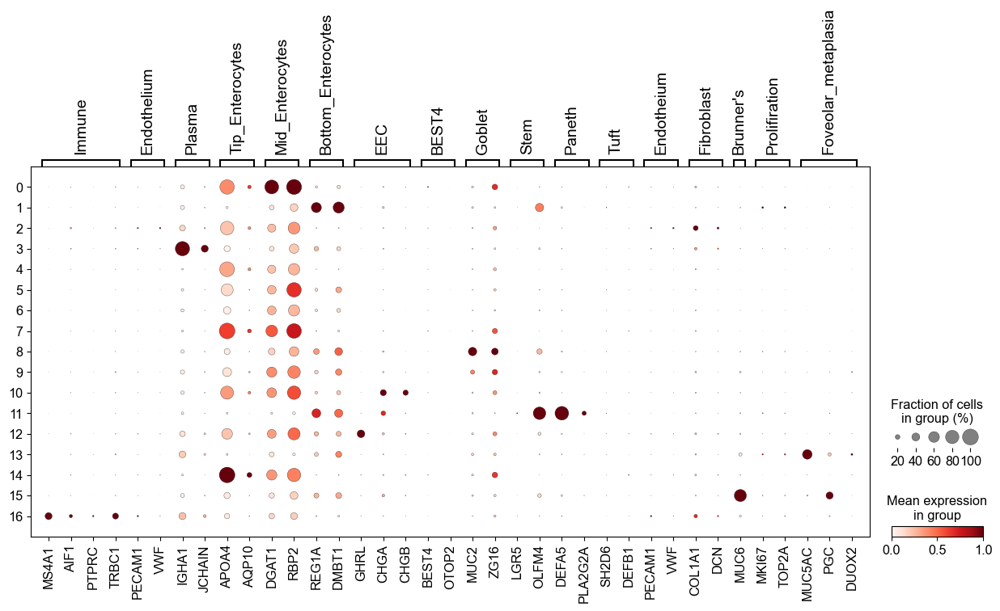

In [22]:
marker_genes = {
    "Immune":["MS4A1","AIF1","PTPRC","TRBC1"],
    'Endothelium':['PECAM1','VWF'],
    "Plasma":["IGHA1","JCHAIN"],
    "Tip_Enterocytes":["APOA4","AQP10"],
    "Mid_Enterocytes":["DGAT1","RBP2"],
    "Bottom_Enterocytes":["REG1A","DMBT1"],
    "EEC":["GHRL","CHGA","CHGB"],
    "BEST4":["BEST4","OTOP2"],
    "Goblet":["MUC2","ZG16"],
    "Stem":["LGR5","OLFM4"],
    "Paneth":["DEFA5","PLA2G2A"],
    "Tuft":["SH2D6","DEFB1"],
    "Endotheium":["PECAM1","VWF"],
    "Fibroblast":["COL1A1","DCN"],
    "Brunner's":["MUC6"],
    "Prolifiration":["MKI67","TOP2A",],
    # "Celiac_enterocytes":["MMP10"],
    "Foveolar_metaplasia":["MUC5AC","PGC","DUOX2"],
}
sc.pl.dotplot(all_ad, marker_genes, groupby="leiden", standard_scale="var")

### DGE

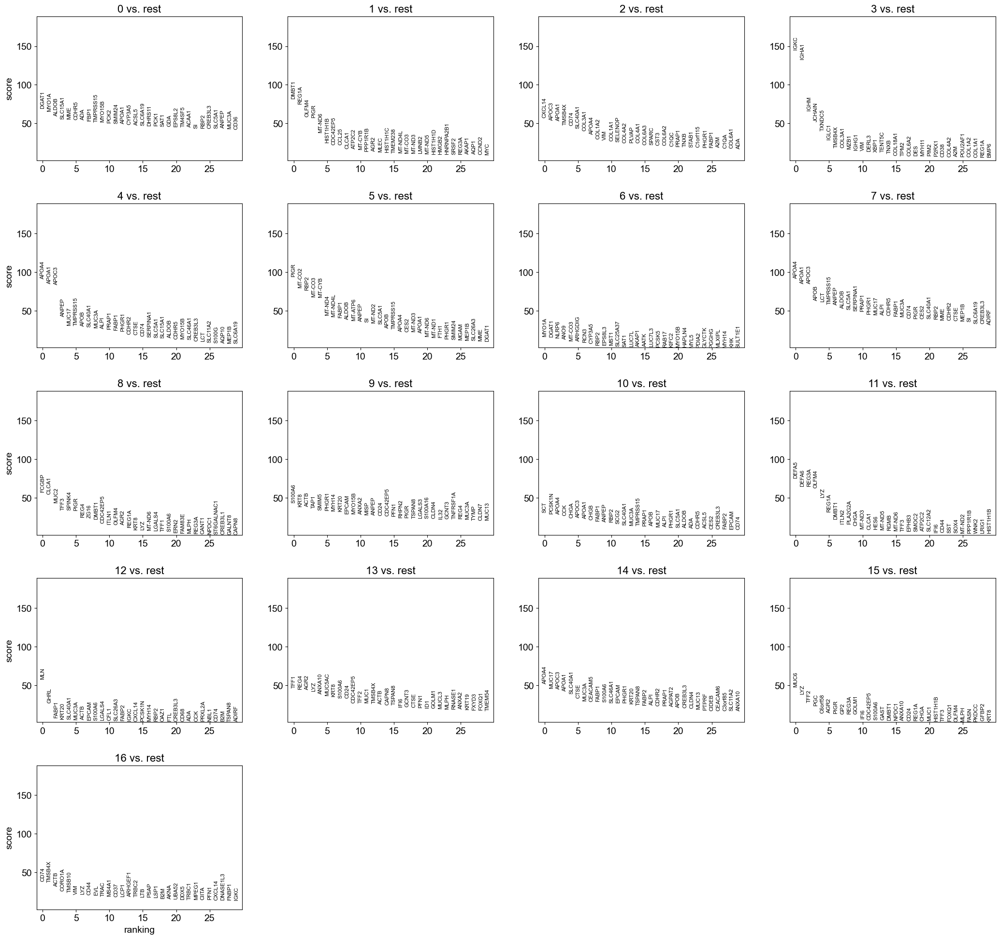

In [23]:
sc.tl.rank_genes_groups(all_ad,  groupby='leiden',  method='wilcoxon', layer='log_norm')
sc.pl.rank_genes_groups(all_ad,  groupby='leiden',  n_genes=30)

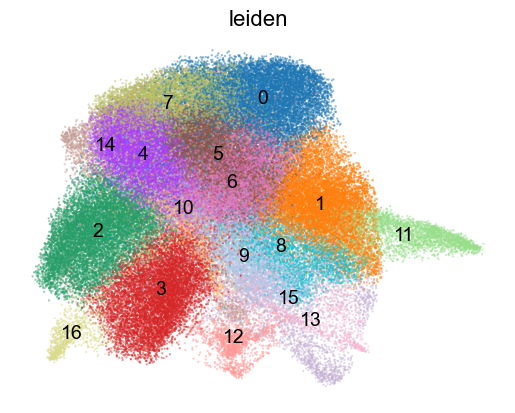

In [24]:
sc.pl.umap(all_ad, color=["leiden"], legend_loc='on data', frameon=False, size=10, alpha=0.5)

In [25]:
# show on ST 72
st72_ad = all_ad[all_ad.obs.sample_name == "ST_072"].copy()
st72_ad

AnnData object with n_obs × n_vars = 10216 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'cell_x_um', 'cell_y_um', 'geometry', 'sample_name', 'macrozone', 'MM_LP_crypt', 'brunner', 'villus', 'immune', 'lowest_lumen', 'crypt_base', 'pixel_class', 'bc', 'slide', 'sum_of_umis', 'block_id', 'pt', 'age', 'sex', 'group', 'ttg', 'inflammation_bulb', 'inflammation_2nd_part', 'visium_batch', 'dv200', 'uscd', 'block_name', 'notes', 'median_sum_of_umis', 'crypt_villi_part', 'leiden', 'sum_umis', 'log10_sum_umis'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'pt_colors', 'rank_genes_groups'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'mat_norm', 'log_norm', 'log_zscore'
    obsp: 'distances', 'connectivities'

In [26]:
print(UMI_THRESH)
print(leiden_res)

100
1.5


In [27]:
all_ad.obs['cell_type_lvl1'] = "NA"
if (UMI_THRESH == 100) and (leiden_res == 1.5):
    print("Condition1")
    all_ad.obs['cell_type_lvl1'] = all_ad.obs.leiden.astype(str).map({
        "0":"Enterocytes",#
        "1":"TA",#
        "2":"Stroma",#
        "3":"Plasma",#
        "4":"Enterocytes",#
        "5":"Enterocytes",#
        "6":"Enterocytes",#
        "7":"Enterocytes",#
        "8":"Goblet",#
        "9":"Enterocytes",#
        "10":"EEC",#
        "11":"Crypt",#
        "12":"EEC",#
        "13":"Metaplasia",#
        "14":"Enterocytes",#
        "15":"Brunner",#
        "16":"Immune",#
    })
else:
    print("CONDITION UNKNOWN")

Condition1


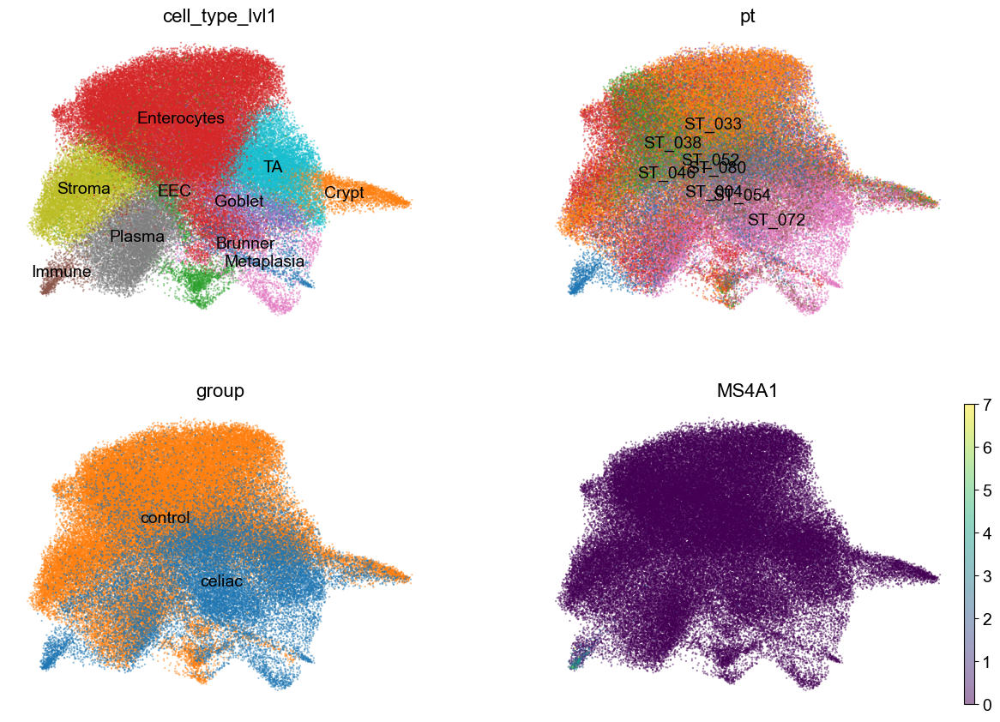

In [28]:
sc.pl.umap(all_ad, color=["cell_type_lvl1", 'pt', 'group','MS4A1'], ncols=2, legend_loc='on data', frameon=False, size=10, alpha=0.5)

## Figures

In [29]:
# create dir for fig1 if not exists
vhd_fig_save_path = os.getcwd()+"/figures/supp_fig_vhd"
if not os.path.exists(vhd_fig_save_path):
    os.makedirs(vhd_fig_save_path)

# create dir for fig1 if not exists
fig1_save_path = os.getcwd()+"/figures/fig1"
if not os.path.exists(fig1_save_path):
    os.makedirs(fig1_save_path)

### Clusters UMAP

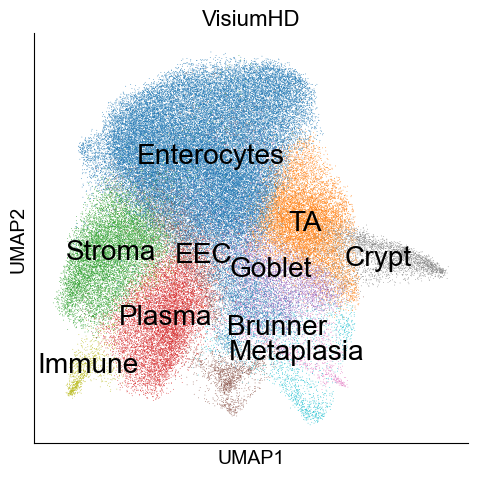

In [30]:
# Define a dictionary mapping cell types to specific colors
cell_type_palette = {
    "Enterocytes": "#1f77b4",
    "TA": "#ff7f0e",
    "Stroma": "#2ca02c",
    "Plasma": "#d62728",
    "Goblet": "#9467bd",
    "EEC": "#8c564b",
    "Brunner": "#e377c2",
    "Crypt": "#7f7f7f",
    "Immune": "#bcbd22",
    "Metaplasia": "#17becf"
}

fig, ax = plt.subplots(figsize=(5, 5))
sc.pl.umap(all_ad, color=['cell_type_lvl1'], palette=cell_type_palette, ncols=2, legend_loc='on data', legend_fontweight='heavy',
             legend_fontsize='x-large', ax=ax, show=False)
# Add white outline to text
# for text in ax.texts:
#     text.set_path_effects([withStroke(linewidth=2, foreground='white')])

plt.title("VisiumHD")
sns.despine()
plt.tight_layout()
plt.show()

# rasterize
for coll in ax.collections:
        coll.set_rasterized(True)
        
# export to PDF
# fig.savefig(vhd_fig_save_path+"/Supp_Fig_umap_cell_types_visiumHD.pdf", bbox_inches='tight')

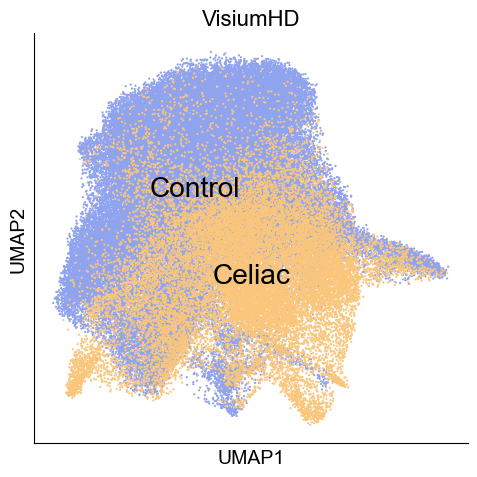

In [31]:
diagnosis_palette = [ "#fac67c","#8fa3ee"]  # Control: blue, CeD: orange
fig,ax = plt.subplots(figsize=(5,5))
sc.pl.umap(all_ad, color=['group'], palette=diagnosis_palette, legend_loc='on data', 
           size=10, alpha=1, ax=ax,show=False, legend_fontweight='heavy', legend_fontsize='x-large')
for text in ax.texts:
    # text.set_path_effects([withStroke(linewidth=2, foreground='white')])
    text.set_text(text.get_text().capitalize())
plt.title("VisiumHD")
sns.despine()
plt.tight_layout()
plt.show()

# rasterize
for coll in ax.collections:
        coll.set_rasterized(True)

# export to PDF
fig.savefig(vhd_fig_save_path+"/Supp_fig_umap_diagnosis_visiumHD.pdf", bbox_inches='tight')

#### Export pseudobulk

In [32]:
# create pseudobulk dataframe
lvl1_cell_types = all_ad.obs['cell_type_lvl1'].unique().tolist()
print("Cell types:", lvl1_cell_types)
pseudobulk_df = pd.DataFrame(index=all_ad.var_names, columns=lvl1_cell_types)
for cell_type in tqdm(lvl1_cell_types):
    tmp_ad = all_ad[all_ad.obs['cell_type_lvl1'] == cell_type, :].copy()
    # mean expression per cell type
    mean_expression = np.array(tmp_ad.layers['log_norm'].mean(axis=0)).squeeze()
    pseudobulk_df[cell_type] = mean_expression
pseudobulk_df.to_csv("pseudobulk_data/pseudobulk_visiumHD_cell_type_lvl1_UMI_{}_res_{}.csv".format(UMI_THRESH, leiden_res))

Cell types: ['Enterocytes', 'Crypt', 'EEC', 'Plasma', 'TA', 'Goblet', 'Stroma', 'Brunner', 'Immune', 'Metaplasia']


  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [00:12<00:00,  1.27s/it]


### Clusters on H&E - Control

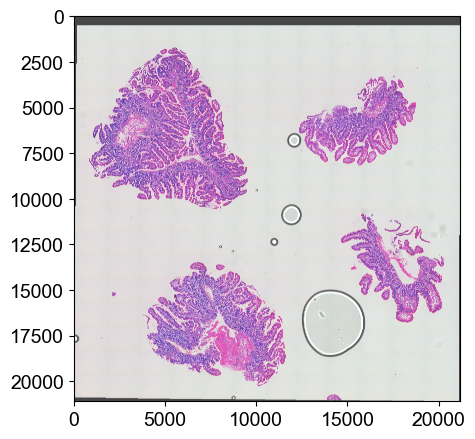

In [33]:
# load image and plot pixels according to clusters
ct_image_path = f"../visiumhd_experiment1/4_files_for_processing/brightened_Celiac_slide2-6_merged_celiac_slide2-6_ch00.tif"
ct_image = tiff.imread(ct_image_path)
fig, ax = plt.subplots(figsize=(5,5))
ax.imshow(ct_image, cmap='gray')
plt.show()

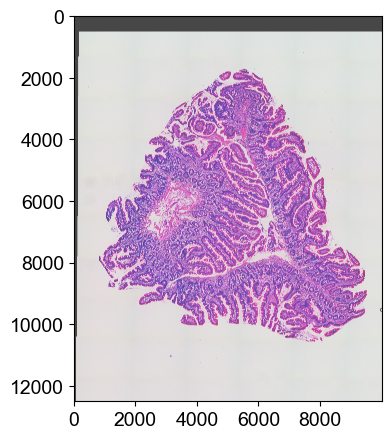

In [34]:
ct_image_cropped = ct_image[:12500, :10000]
fig, ax = plt.subplots(figsize=(5,5))
ax.imshow(ct_image_cropped, cmap='gray')
plt.show()

In [35]:
# select pt to show
st33_ad = all_ad[all_ad.obs.sample_name == "ST_033"].copy()
st33_ad

AnnData object with n_obs × n_vars = 29975 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'cell_x_um', 'cell_y_um', 'geometry', 'sample_name', 'macrozone', 'MM_LP_crypt', 'brunner', 'villus', 'immune', 'lowest_lumen', 'crypt_base', 'pixel_class', 'bc', 'slide', 'sum_of_umis', 'block_id', 'pt', 'age', 'sex', 'group', 'ttg', 'inflammation_bulb', 'inflammation_2nd_part', 'visium_batch', 'dv200', 'uscd', 'block_name', 'notes', 'median_sum_of_umis', 'crypt_villi_part', 'leiden', 'sum_umis', 'log10_sum_umis', 'cell_type_lvl1'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'pt_colors', 'rank_genes_groups', 'cell_type_lvl1_colors', 'group_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'mat_norm', 'log_norm', 'log_zscore'
    obsp: 'distances', 'connectivitie

In [36]:
# Define a dictionary mapping cell types to specific colors
cell_type_palette = {
    "Enterocytes": "#1f77b4",
    "TA": "#17becf",
    "Stroma": "#2ca02c",
    "Plasma": "#d62728",
    "Goblet": "#9467bd",
    "EEC": "#8c564b",
    "Brunner": "#e377c2",
    "Crypt": "#7f7f7f",
    "Immune": "#bcbd22",
    "Metaplasia": "#ff7f0e",
}

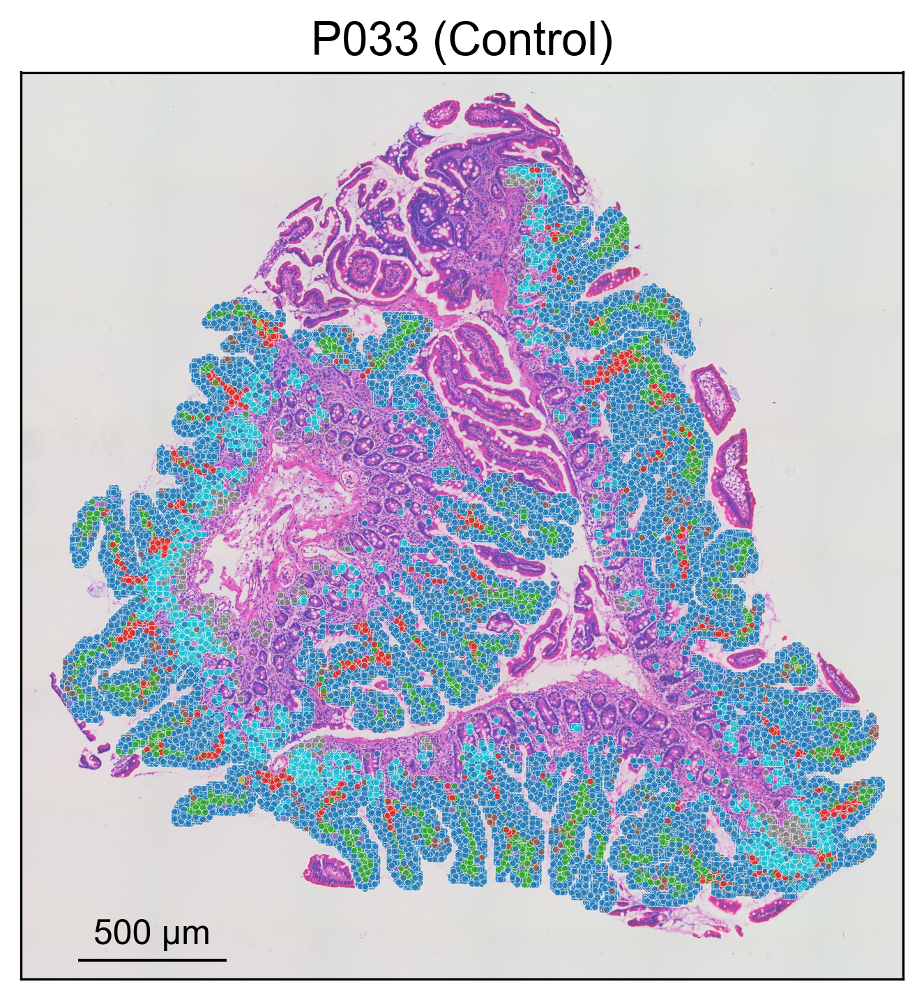

In [37]:
RASTERIZE = True
if RASTERIZE:
    raster_str = "_rasterized"
else:
    raster_str = "_no_rasterized"
LEGEND = False
if LEGEND:
    legend_str = "_with_legend"
else:
    legend_str = "_no_legend"

fig, ax = plt.subplots(figsize=(5,5), dpi=300)
ax.imshow(ct_image_cropped)

sns.scatterplot(st33_ad.obs, x='pxl_col_in_fullres', y='pxl_row_in_fullres', hue='cell_type_lvl1', palette=cell_type_palette, s=5, alpha=0.8, ax=ax)
# rasterize
if RASTERIZE:
    for collection in ax.collections:
        collection.set_rasterized(True)

# legend outside
if LEGEND:
    plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=4)
else:
    plt.legend([],[], frameon=False)
plt.title("P033 (Control)")
plt.xticks([])
plt.yticks([])
plt.xlabel("")
plt.ylabel("")

# make spines invisible
for spine in ax.spines.values():
    spine.set_visible(True)

plt.tight_layout()

# crop
y_min, y_max = 1500, 11000
x_min, x_max = 500, 9750

ax.set_xlim(x_min, x_max)
ax.set_ylim(y_max, y_min)  # Invert y-axis

# add scalebar
scalebar_length_um = 500
start_bar_x = 1100
scalebar_y = y_max - 200

end_bar_x = start_bar_x + scalebar_length_um / scalefactors_ct['microns_per_pixel']

ax.plot([start_bar_x, end_bar_x], [scalebar_y, scalebar_y], color='black', linewidth=1, solid_capstyle='butt')
ax.text((start_bar_x + end_bar_x) / 2, scalebar_y-100, f"{scalebar_length_um} µm",
        ha='center', va='bottom', color='black', fontsize=12)



plt.show()

# export to PDF
fig.savefig(fig1_save_path+"/Fig1F_spatial_cell_types_ST033_visiumHD"+raster_str+legend_str+".pdf", bbox_inches='tight')

### Clusters on H&E - Celiac

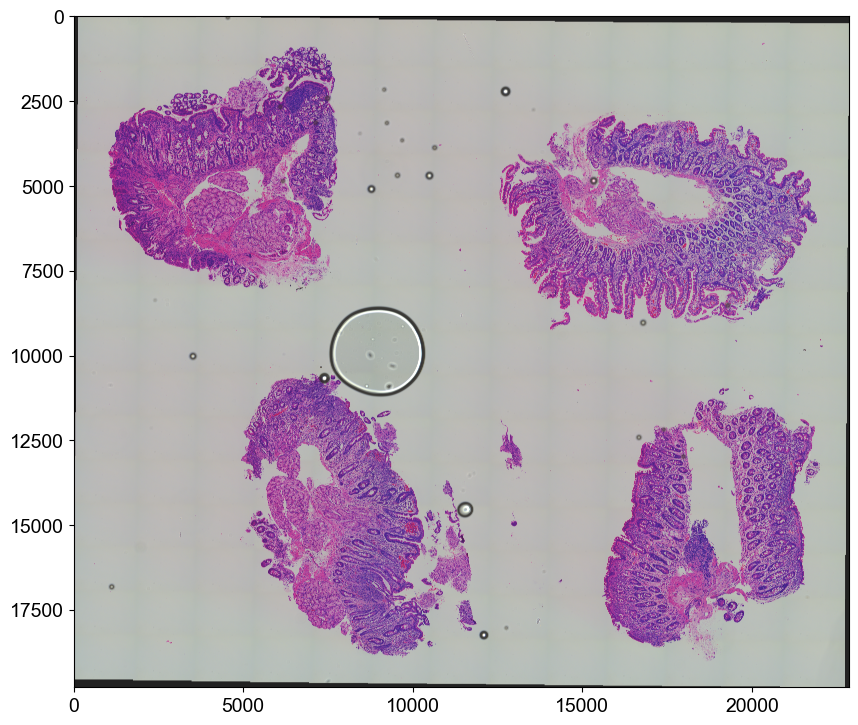

In [38]:
# load image and plot pixels according to clusters
ced_image_path = f"../visiumhd_experiment1/4_files_for_processing/brightened_Celiac_slide_1-1-merged_TileScan_1_Merged_ch00.tif"
ced_image = tiff.imread(ced_image_path)
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(ced_image, cmap='gray')
plt.show()

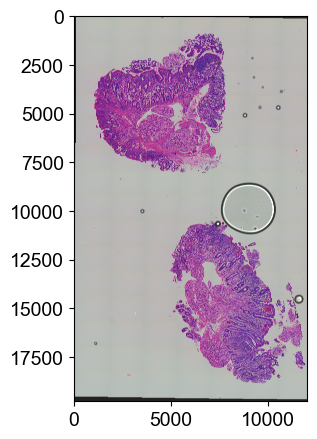

In [39]:
ced_image_cropped = ced_image[:, :12000]
fig, ax = plt.subplots(figsize=(5,5))
ax.imshow(ced_image_cropped, cmap='gray')
plt.show()

In [40]:
# select pt to show
st72_ad = all_ad[all_ad.obs.sample_name == "ST_072"].copy()
st72_ad

AnnData object with n_obs × n_vars = 10216 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'cell_x_um', 'cell_y_um', 'geometry', 'sample_name', 'macrozone', 'MM_LP_crypt', 'brunner', 'villus', 'immune', 'lowest_lumen', 'crypt_base', 'pixel_class', 'bc', 'slide', 'sum_of_umis', 'block_id', 'pt', 'age', 'sex', 'group', 'ttg', 'inflammation_bulb', 'inflammation_2nd_part', 'visium_batch', 'dv200', 'uscd', 'block_name', 'notes', 'median_sum_of_umis', 'crypt_villi_part', 'leiden', 'sum_umis', 'log10_sum_umis', 'cell_type_lvl1'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'pt_colors', 'rank_genes_groups', 'cell_type_lvl1_colors', 'group_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'mat_norm', 'log_norm', 'log_zscore'
    obsp: 'distances', 'connectivitie

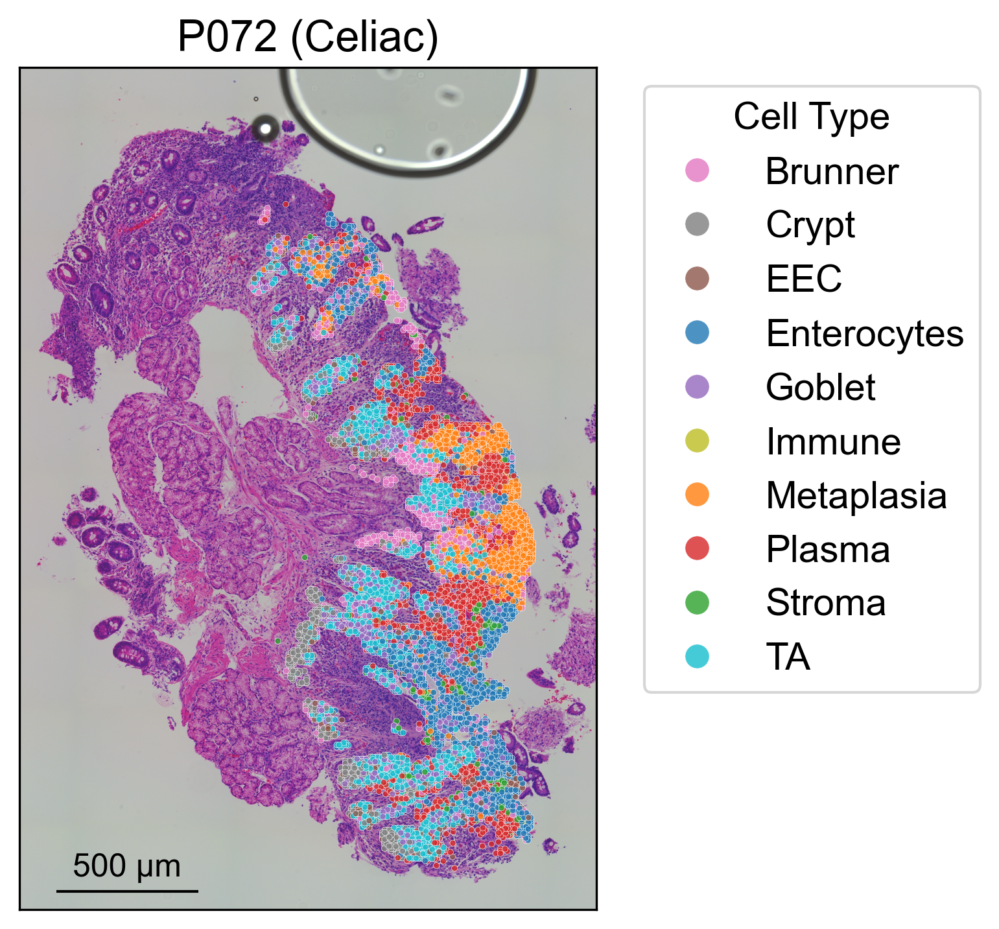

In [41]:
RASTERIZE = True
if RASTERIZE:
    raster_str = "_rasterized"
else:
    raster_str = "_no_rasterized"
LEGEND = True
if LEGEND:
    legend_str = "_with_legend"
else:
    legend_str = "_no_legend"

fig, ax = plt.subplots(figsize=(5,5), dpi=300)
ax.imshow(ced_image_cropped)

sns.scatterplot(st72_ad.obs, x='pxl_col_in_fullres', y='pxl_row_in_fullres', hue='cell_type_lvl1', palette=cell_type_palette, s=5, alpha=0.8, ax=ax)
# rasterize
if RASTERIZE:
    for collection in ax.collections:
        collection.set_rasterized(True)

# legend outside
if LEGEND:
    plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=4)
else:
    plt.legend([],[], frameon=False)
plt.title("P072 (Celiac)")
plt.xticks([])
plt.yticks([])
plt.xlabel("")
plt.ylabel("")

# make spines invisible
for spine in ax.spines.values():
    spine.set_visible(True)

plt.tight_layout()

# crop
y_min, y_max = 10000, 19200
x_min, x_max = 4700, 11000

ax.set_xlim(x_min, x_max)
ax.set_ylim(y_max, y_min)  # Invert y-axis

# # add scalebar
scalebar_length_um = 500
start_bar_x = 5100
scalebar_y = y_max - 200

end_bar_x = start_bar_x + scalebar_length_um / scalefactors_ced['microns_per_pixel']

ax.plot([start_bar_x, end_bar_x], [scalebar_y, scalebar_y], color='black', linewidth=1, solid_capstyle='butt')
ax.text((start_bar_x + end_bar_x) / 2, scalebar_y-100, f"{scalebar_length_um} µm",
        ha='center', va='bottom', color='black', fontsize=12)

plt.show()

# export to PDF
fig.savefig(fig1_save_path+"/Fig1G_spatial_cell_types_ST072_visiumHD"+raster_str+legend_str+".pdf", bbox_inches='tight')

In [42]:
save_name = f'all_ad_w_annotations_UMI{UMI_THRESH}_leiden{leiden_res}.dill'
save_name

'all_ad_w_annotations_UMI100_leiden1.5.dill'

In [44]:
# save all_ad to dill
save_name = f'all_ad_w_annotations_UMI{UMI_THRESH}_leiden{leiden_res}.dill'
with open(save_name, 'wb') as f:
    dill.dump(all_ad, f)

In [45]:
# save all_ad to dill
save_name = f'/mnt/d/celiac_files/all_ad_w_annotations_UMI{UMI_THRESH}_leiden{leiden_res}.dill'
with open(save_name, 'wb') as f:
    dill.dump(all_ad, f)

In [ ]:
# turn geometry into string to allow exporting using h5ad
all_ad.obs['geometry'] = [str(x) for x in all_ad.obs['geometry']]

In [ ]:
# export as h5ad
save_name = f'all_ad_w_annotations_UMI{UMI_THRESH}_leiden{leiden_res}.h5ad'
all_ad.write_h5ad(save_name)
# also in /mnt/d/celiac_files/
save_name = f'/mnt/d/celiac_files/all_ad_w_annotations_UMI{UMI_THRESH}_leiden{leiden_res}.h5ad'
all_ad.write_h5ad(save_name)

In [46]:
# add UMAP to adata.obs
# all_ad.obs['umap_1'] = all_ad.obsm['X_umap'][:, 0]
# all_ad.obs['umap_2'] = all_ad.obsm['X_umap'][:, 1]

# export adata and adata.obs both to csv
# all_ad.to_df().to_csv(f"all_ad_UMI{UMI_THRESH}_leiden{leiden_res}.csv")
# all_ad.obs.to_csv(f"all_ad_obs_UMI{UMI_THRESH}_leiden{leiden_res}.csv")

In [47]:
print(datetime.now())

2026-01-13 10:15:06.684512


In [48]:
print(session_info2.session_info(dependencies=True))

anndata	0.12.2
pandas	2.3.2
scanpy	1.11.4
numpy	2.2.6
tqdm	4.67.1
seaborn	0.13.2
matplotlib	3.10.6
geopandas	1.1.1
scipy	1.15.3
dill	0.4.0
gseapy	1.1.10
plotly	6.3.0
adjustText	1.3.0
statsmodels	0.14.5
tifffile	2025.8.28
shapely	2.1.1
----	----
requests	2.32.5
sphinxcontrib-htmlhelp	2.1.0
Pygments	2.19.2
wcwidth	0.2.13
llvmlite	0.44.0
setuptools	78.1.1
urllib3	2.5.0
pytz	2025.2
fsspec	2025.9.0
numba	0.61.2
kiwisolver	1.4.9
legacy-api-wrap	1.4.1
h5py	3.14.0
umap-learn	0.5.9.post2
Jinja2	3.1.6
dask	2024.11.2
prompt_toolkit	3.0.52
pyarrow	21.0.0
jupyter_client	8.6.3
jupyter_core	5.8.1
pyparsing	3.2.3
leidenalg	0.10.2
donfig	0.8.1.post1
threadpoolctl	3.6.0
numcodecs	0.15.1
traitlets	5.14.3
Deprecated	1.2.18
asttokens	3.0.0
narwhals	2.5.0
platformdirs	4.4.0
python-dateutil	2.9.0.post0
MarkupSafe	3.0.2
jedi	0.19.2
zarr	3.1.3
texttable	1.7.0
charset-normalizer	3.4.3
natsort	8.4.0
pyproj	3.7.2
sphinxcontrib-jsmath	1.0.1
cycler	0.12.1
parso	0.8.5
pillow	11.3.0
pynndescent	0.5.13
cloudpickle	3.1